# Dangerous Farm Insects

## Import Library & Dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import seaborn as sns
import cv2
from PIL import Image, UnidentifiedImageError
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from collections import Counter, defaultdict
import hashlib

In [2]:
data_path = "./farm_insects/"
dataset_images = []
dataset_class_list = []
label_class = []
valid_exts = (".png", ".jpg", ".jpeg")

for folder_name in os.listdir(data_path):
    folder_path = os.path.join(data_path, folder_name)
    if os.path.isdir(folder_path):
        label_class.append(folder_name)

print("Label class:", label_class)

Label class: ['Africanized Honey Bees (Killer Bees)', 'Aphids', 'Armyworms', 'Brown Marmorated Stink Bugs', 'Cabbage Loopers', 'Citrus Canker', 'Colorado Potato Beetles', 'Corn Borers', 'Corn Earworms', 'Fall Armyworms', 'Fruit Flies', 'Spider Mites', 'Thrips', 'Tomato Hornworms', 'Western Corn Rootworms']


In [3]:
for i, label in enumerate(label_class):
    img_dir = os.path.join(data_path, label)
    
    for j, img in enumerate(os.listdir(img_dir)):
        img_path = os.path.join(img_dir, img)
        
        try:
            # Convert to RGB
            img_pil = Image.open(img_path).convert("RGB")

            # Convert to array
            image = img_to_array(img_pil)
            image = image / 255.0

            dataset_images.append(image)
            dataset_class_list.append(i)

        except Exception as e:
            print(f"Skip {img_path}: {e}")

c:\Python\environments\computer_vision\lib\site-packages\PIL\Image.py:993: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


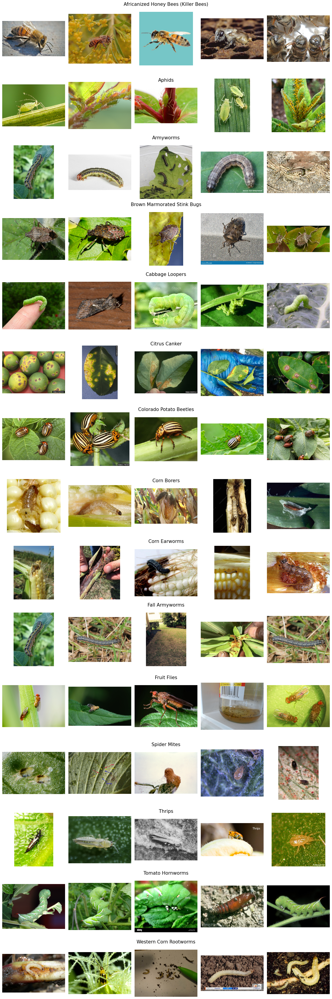

In [4]:
fig, plot_grid = plt.subplots(len(label_class), 5, figsize=(15, 3 * len(label_class)))

for i, label in enumerate(label_class):
    contoh_idx = [idx for idx, c in enumerate(dataset_class_list) if c == i][:5]

    for j, idx in enumerate(contoh_idx):
        kotak = plot_grid[i, j] if len(label_class) > 1 else plot_grid[j]
        kotak.imshow(dataset_images[idx])
        kotak.axis("off")
        if j == 2:
            kotak.set_title(label, fontsize=15, pad=20)

plt.tight_layout()
plt.show()

## Exploratory Data Analysis (EDA)

#### 1. Class Distribution & Imbalance

In [5]:
image_per_class = Counter(dataset_class_list)

print("Total images per class:")
for i, jumlah in image_per_class.items():
    print(f"{label_class[i]:<36} : {jumlah}")

Total images per class:
Africanized Honey Bees (Killer Bees) : 97
Aphids                               : 88
Armyworms                            : 96
Brown Marmorated Stink Bugs          : 114
Cabbage Loopers                      : 104
Citrus Canker                        : 104
Colorado Potato Beetles              : 112
Corn Borers                          : 115
Corn Earworms                        : 110
Fall Armyworms                       : 113
Fruit Flies                          : 101
Spider Mites                         : 119
Thrips                               : 109
Tomato Hornworms                     : 109
Western Corn Rootworms               : 100


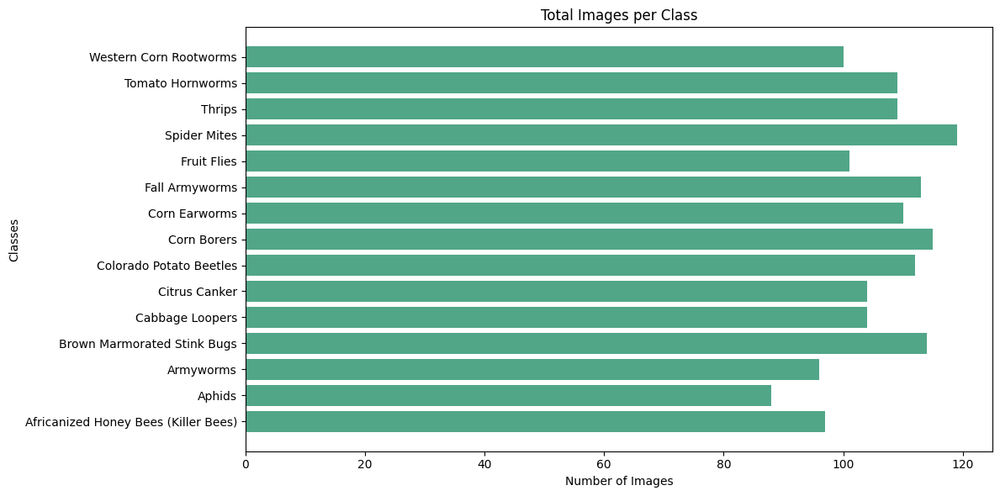

In [6]:
labels = [label_class[i] for i in image_per_class.keys()]
counts = [jumlah for jumlah in image_per_class.values()]

plt.figure(figsize=(12,6))
plt.barh(labels, counts, color="#51A687")
plt.xlabel("Number of Images")
plt.ylabel("Classes")
plt.title("Total Images per Class")
plt.tight_layout()
plt.show()

#### 2. Check Duplicated Images

##### 2.1 Same Class

In [7]:
def get_array_hash(img_array):
    return hashlib.md5(img_array.tobytes()).hexdigest()

In [8]:
duplicate_summary = {label: 0 for label in label_class}
seen_hashes = {label: {} for label in label_class}

for idx, (img_array, cls_idx) in enumerate(zip(dataset_images, dataset_class_list)):
    cls_name = label_class[cls_idx]
    h = get_array_hash(img_array)
    if h in seen_hashes[cls_name]:
        duplicate_summary[cls_name] += 1
        seen_hashes[cls_name][h].append(idx)
    else:
        seen_hashes[cls_name][h] = [idx]

In [9]:
print("Duplicate image summary per class:")
for cls, dup_count in duplicate_summary.items():
    print(f"{cls:<36} : {dup_count:<2} duplicates")

total_duplicates = sum(duplicate_summary.values())
print(f"{'Total duplicates':<36} : {total_duplicates:<2} duplicates")

Duplicate image summary per class:
Africanized Honey Bees (Killer Bees) : 2  duplicates
Aphids                               : 4  duplicates
Armyworms                            : 2  duplicates
Brown Marmorated Stink Bugs          : 1  duplicates
Cabbage Loopers                      : 0  duplicates
Citrus Canker                        : 1  duplicates
Colorado Potato Beetles              : 3  duplicates
Corn Borers                          : 1  duplicates
Corn Earworms                        : 3  duplicates
Fall Armyworms                       : 0  duplicates
Fruit Flies                          : 0  duplicates
Spider Mites                         : 2  duplicates
Thrips                               : 0  duplicates
Tomato Hornworms                     : 3  duplicates
Western Corn Rootworms               : 4  duplicates
Total duplicates                     : 26 duplicates


##### 2.2 Cross-Class

In [10]:
global_hashes = {}
cross_class_duplicates = []

for idx, (img_array, cls_idx) in enumerate(zip(dataset_images, dataset_class_list)):
    cls_name = label_class[cls_idx]
    h = get_array_hash(img_array)

    if h in global_hashes:
        for prev_idx, prev_cls in global_hashes[h]:
            if prev_cls != cls_name:
                cross_class_duplicates.append((h, prev_cls, cls_name))
        global_hashes[h].append((idx, cls_name))
    else:
        global_hashes[h] = [(idx, cls_name)]

In [11]:
print("Cross-class duplicate summary:")

if cross_class_duplicates:
    for i, (h, cls1, cls2) in enumerate(cross_class_duplicates, start=1):
        print(f"{i:>2}. Hash {h} found in {cls1} and {cls2}")
else:
    print("No identical images found across different classes.")

Cross-class duplicate summary:
 1. Hash 2bf4b5907ca8bfe71fe5efa191bb48e3 found in Armyworms and Fall Armyworms
 2. Hash c931721c64269e57ba5971124da4db91 found in Armyworms and Fall Armyworms
 3. Hash b4e03e92660d4ad52abbf6fc54e77384 found in Armyworms and Fall Armyworms
 4. Hash 7d809a5eb0a29a1e401c4079b266838d found in Armyworms and Fall Armyworms
 5. Hash eccf8ab285ea171735e57b8d3e6f0a14 found in Armyworms and Fall Armyworms
 6. Hash d92f7e34a36d4fef75d5626eac8829e1 found in Armyworms and Fall Armyworms
 7. Hash ee38894e0b12fcdd708ab2feae08e7d3 found in Armyworms and Fall Armyworms
 8. Hash 53586f3797b17406a3af7e51c9956865 found in Armyworms and Fall Armyworms
 9. Hash 190bd8e5428e8a7bcc10789fa3bd482c found in Armyworms and Fall Armyworms
10. Hash 3d9c48e9a201ee4337ac81dea19958e2 found in Armyworms and Fall Armyworms
11. Hash f7d3f0a1d426e192142a9cabb7ec4fdc found in Armyworms and Fall Armyworms
12. Hash a1cdc4bab43193dcaa887a00cfbc8185 found in Armyworms and Fall Armyworms
13. Hash 

Total cross-class duplicate hashes: 24


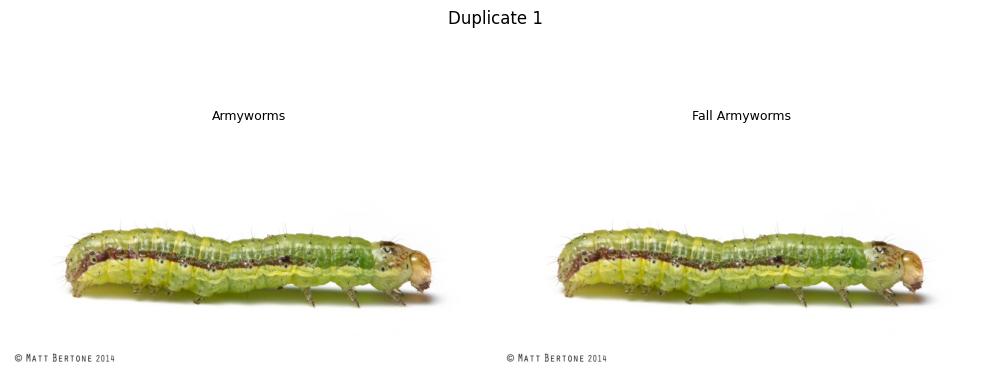

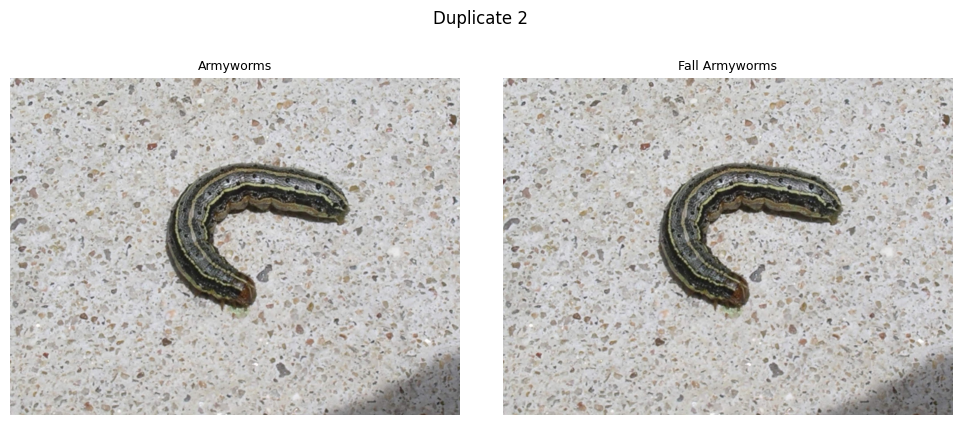

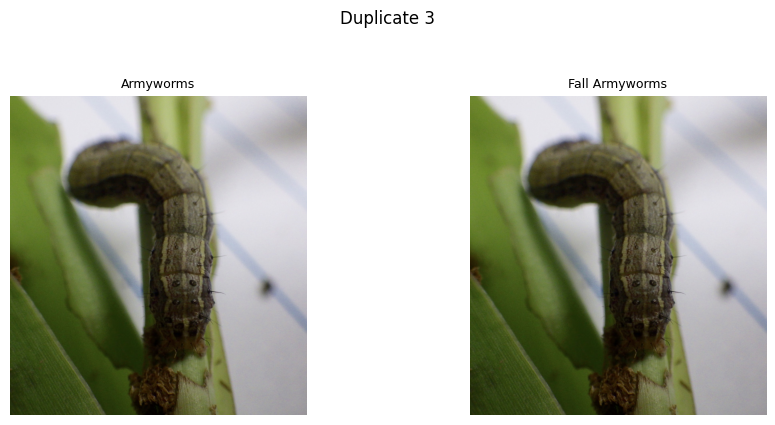

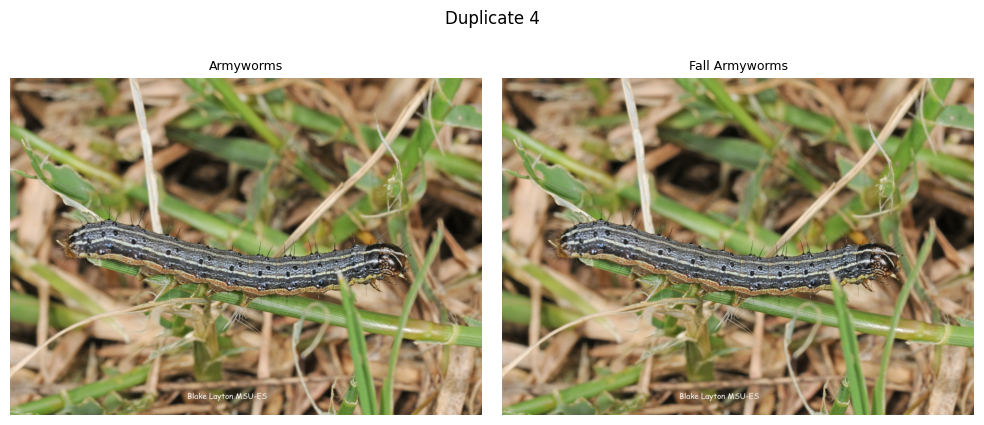

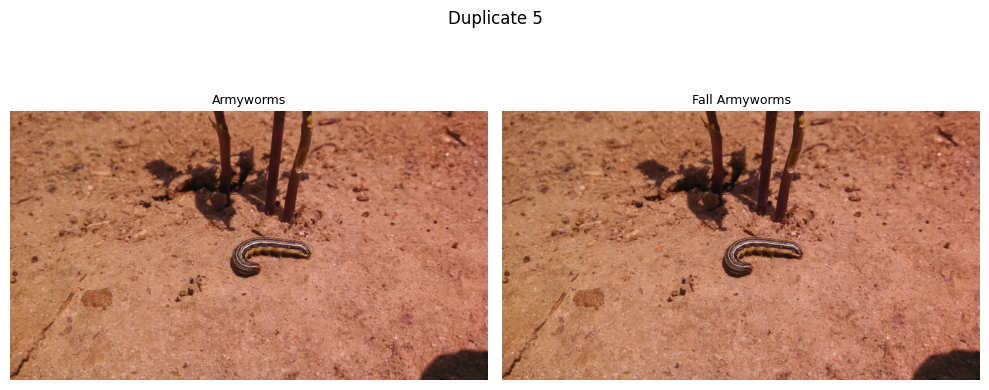

...

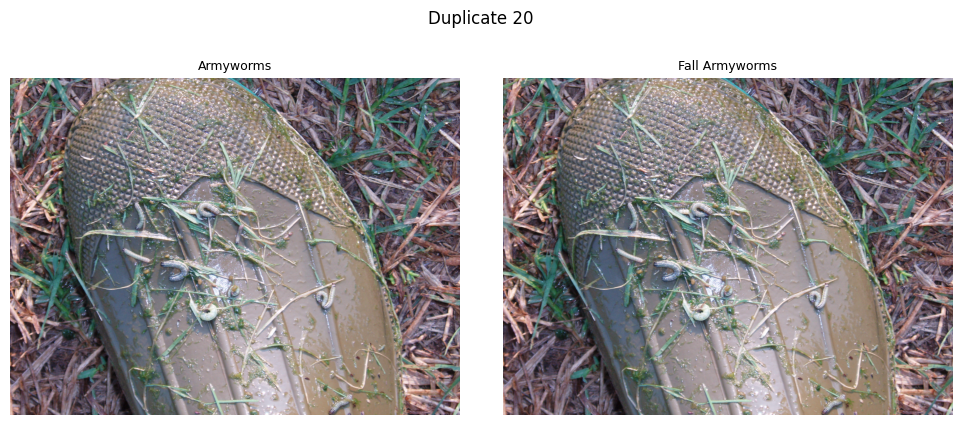

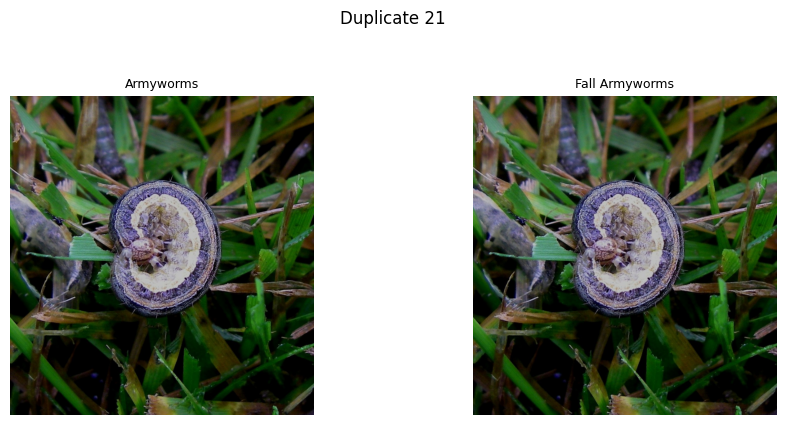

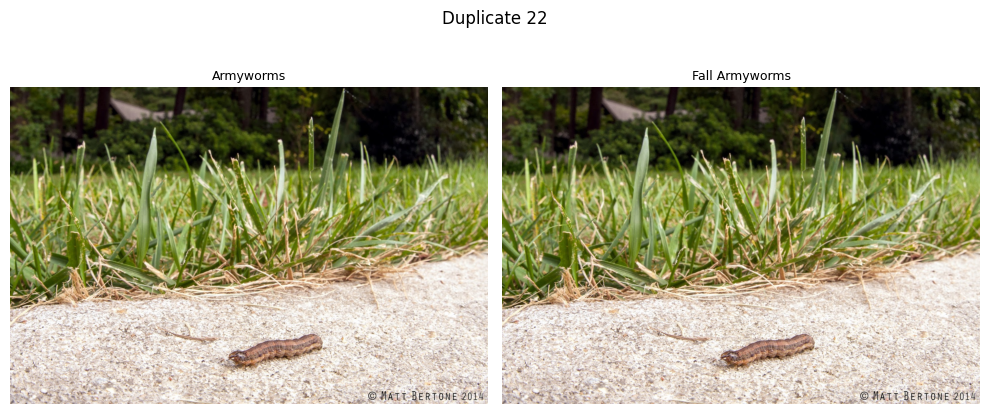

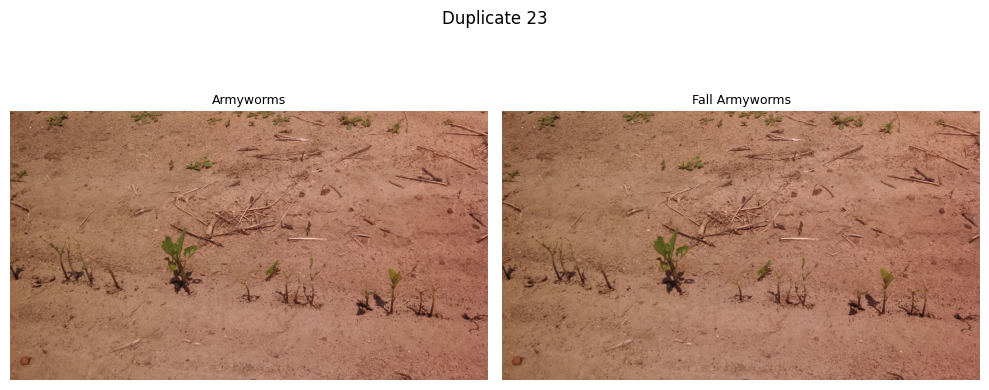

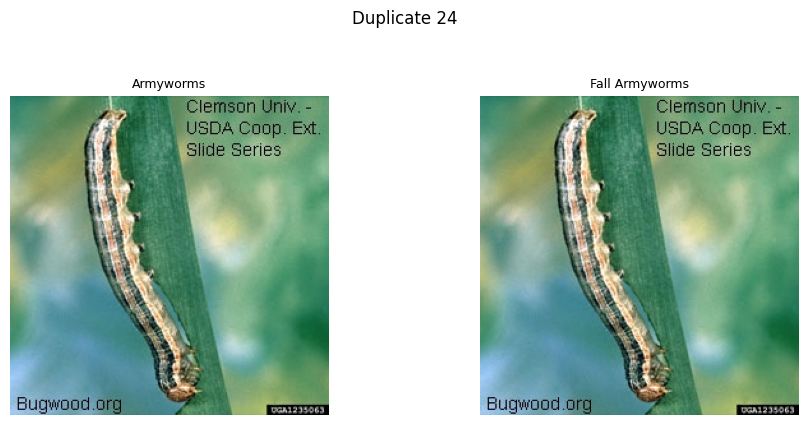

In [12]:
duplicate_hashes = list({h for h, _, _ in cross_class_duplicates})

print(f"Total cross-class duplicate hashes: {len(duplicate_hashes)}")
for j, dup_hash in enumerate(duplicate_hashes, start=1):
    image_indices = [i for i, c in global_hashes[dup_hash]]

    plt.figure(figsize=(10, 4))
    for k, img_idx in enumerate(image_indices):
        plt.subplot(1, len(image_indices), k + 1)
        plt.imshow(dataset_images[img_idx])
        plt.title(label_class[dataset_class_list[img_idx]], fontsize=9)
        plt.axis("off")

    plt.suptitle(f"Duplicate {j}", fontsize=12, y=1.05)
    plt.tight_layout()
    plt.show()

#### 3. Check Broken Image

In [34]:
broken_images = []

for img_array, label in zip(dataset_images, dataset_class_list):
    if (
        img_array is None
        or not isinstance(img_array, np.ndarray)
        or img_array.size == 0
        or np.all(img_array == 0)
    ):
        broken_images.append((img_array, label))

print("Total broken images:", len(broken_images))

for img_array, label in broken_images:
    print(f"Broken image detected | Label: {label}")
    if isinstance(img_array, np.ndarray):
        plt.imshow(img_array.astype("uint8"))
        plt.title(f"Broken: {label}")
        plt.show()

Total broken images: 0


#### 4. Check Distribution Size / Dimension Per Class

In [48]:
dims = []

for img_array, label in zip(dataset_images, dataset_class_list):
    if isinstance(img_array, np.ndarray) and img_array.size > 0:
        h, w, _ = img_array.shape
        dims.append({"class": label, "width": w, "height": h})

In [49]:
label_to_name = {
    0: "Africanized Honey Bees (Killer Bees)",
    1: "Aphids",
    2: "Armyworms",
    3: "Brown Marmorated Stink Bugs",
    4: "Cabbage Loopers",
    5: "Citrus Canker",
    6: "Colorado Potato Beetles",
    7: "Corn Borers",
    8: "Corn Earworms",
    9: "Fall Armyworms",
    10: "Fruit Flies",
    11: "Spider Mites",
    12: "Thrips",
    13: "Tomato Hornworms",
    14: "Western Corn Rootworms"
}

Total number of dimension records: 1591
   class  width  height
0      0   1160     650
1      0   1279    1010
2      0    200     200
3      0    920     597
4      0    900     665


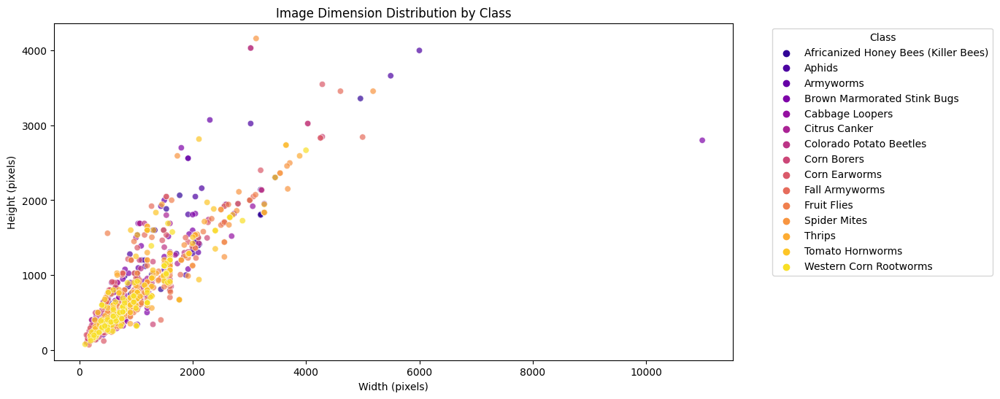

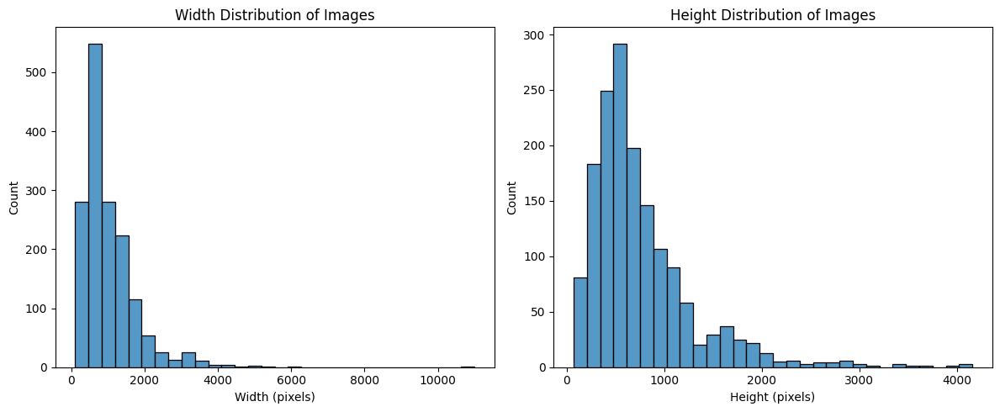

In [56]:
dims_df = pd.DataFrame(dims)

print("Total number of dimension records:", len(dims_df))
print(dims_df.head())

# Scatter plot: width vs height by class
dims_df["class"] = dims_df["class"].map(label_to_name)

plt.figure(figsize=(12, 6))
sns.scatterplot(data=dims_df, x="width", y="height", hue="class", alpha=0.7, palette="plasma")
plt.title("Image Dimension Distribution by Class")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.legend(title="Class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

# Histogram distribution of width and height
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(dims_df["width"], bins=30, kde=False)
plt.title("Width Distribution of Images")
plt.xlabel("Width (pixels)")

plt.subplot(1, 2, 2)
sns.histplot(dims_df["height"], bins=30, kde=False)
plt.title("Height Distribution of Images")
plt.xlabel("Height (pixels)")

plt.tight_layout()
plt.show()

#### 5. Check RGB

In [32]:
modes_after = []

for img_array in dataset_images:
    if img_array.shape[-1] == 3:
        modes_after.append("RGB")
    elif img_array.shape[-1] == 4:
        modes_after.append("RGBA")
    else:
        modes_after.append("Other")

print(Counter(modes_after))

Counter({'RGB': 1591})


#### 6. Check Brightness

In [18]:
brightness = defaultdict(list)

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        brightness[cls].append(np.mean(img))
                except:
                    pass

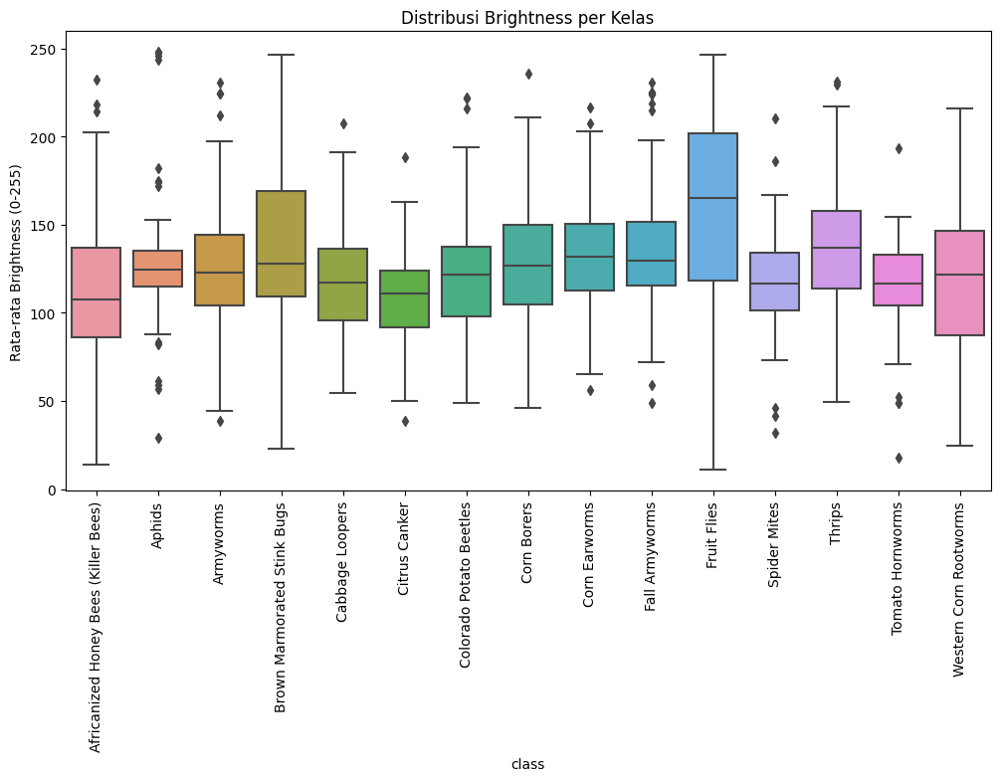

In [19]:
brightness_df = pd.DataFrame([
    {"class": cls, "brightness": b}
    for cls, values in brightness.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=brightness_df, x="class", y="brightness")
plt.xticks(rotation=90)
plt.ylabel("Rata-rata Brightness (0-255)")
plt.title("Distribusi Brightness per Kelas")
plt.show()

#### 7. Check Blur

In [20]:
blur_scores = defaultdict(list)
laplacian_threshold = 100  # threshold blur

for cls in sorted(os.listdir(data_path)):
    cls_path = os.path.join(data_path, cls)
    if os.path.isdir(cls_path):
        for file in os.listdir(cls_path):
            if file.lower().endswith(valid_exts):
                path = os.path.join(cls_path, file)
                try:
                    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
                    if img is not None:
                        score = cv2.Laplacian(img, cv2.CV_64F).var()
                        blur_scores[cls].append(score)
                except:
                    pass

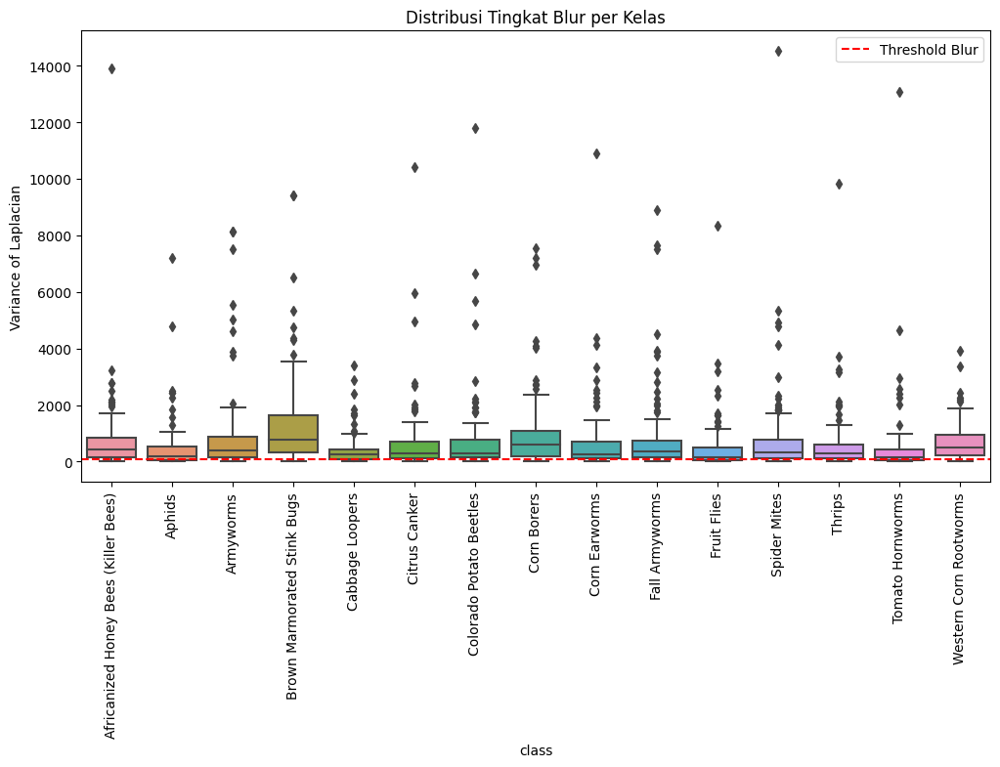

Total gambar dianggap blur (< 100): 345
Total gambar: 1578


In [21]:
blur_df = pd.DataFrame([
    {"class": cls, "blur": b}
    for cls, values in blur_scores.items()
    for b in values
])

plt.figure(figsize=(12,6))
sns.boxplot(data=blur_df, x="class", y="blur")
plt.axhline(laplacian_threshold, color="red", linestyle="--", label="Threshold Blur")
plt.legend()
plt.xticks(rotation=90)
plt.ylabel("Variance of Laplacian")
plt.title("Distribusi Tingkat Blur per Kelas")
plt.show()

total_blur = (blur_df["blur"] < laplacian_threshold).sum()
print(f"Total gambar dianggap blur (< {laplacian_threshold}): {total_blur}")
print(f"Total gambar: {len(blur_df)}")

## Preprocessing

#### 1. Handling Duplicated Images

##### 1.1 Same Class

In [22]:
to_remove = set()

for cls_name, hash_dict in seen_hashes.items():
    for h, idx_list in hash_dict.items():
        if len(idx_list) > 1:
            to_remove.update(idx_list[1:])

print(f"Total duplicates to remove : {len(to_remove)}")

Total duplicates to remove : 26


In [23]:
images_dedup_sameclass = []
labels_dedup_sameclass = []

for idx, (img_array, cls_idx) in enumerate(zip(dataset_images, dataset_class_list)):
    if idx not in to_remove:
        images_dedup_sameclass.append(img_array)
        labels_dedup_sameclass.append(cls_idx)

print(f"Original dataset size : {len(dataset_images)}")
print(f"Cleaned dataset size  : {len(images_dedup_sameclass)}")

Original dataset size : 1591
Cleaned dataset size  : 1565


##### 1.2 Cross-Class

In [24]:
unique_duplicate_hashes = set([h for h, _, _ in cross_class_duplicates])

remove_indices = []
for h in unique_duplicate_hashes:
    for idx, cls in global_hashes[h]:
        remove_indices.append(idx)

remove_indices = sorted(set(remove_indices))
print(f"Total images to remove (cross-class duplicates): {len(remove_indices)}")

Total images to remove (cross-class duplicates): 48


In [25]:
images_dedup_crossclass = [
    img for i, img in enumerate(images_dedup_sameclass) if i not in remove_indices
]
labels_dedup_crossclass = [
    cls for i, cls in enumerate(labels_dedup_sameclass) if i not in remove_indices
]

print(f"After removing duplicates (same class)    : {len(images_dedup_sameclass)}")
print(f"After removing duplicates (across class)  : {len(images_dedup_crossclass)}")

After removing duplicates (same class)    : 1565
After removing duplicates (across class)  : 1517


#### . Handling Blurry Images

In [ ]:
def adaptive_unsharp(img, blur_score):
    if blur_score < 50:
        strength = (1.8, -0.8)
    elif blur_score < 100:
        strength = (1.5, -0.5)
    else:
        strength = (1.3, -0.3)
    
    blurred = cv2.GaussianBlur(img, (5,5), 1.0)
    sharpened = cv2.addWeighted(img, strength[0], blurred, strength[1], 0)
    return sharpened

#### . Normalize Brightness

In [26]:
def preprocess_image(img):
    # 1. CLAHE (normalisasi pencahayaan)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    lab[:,:,0] = clahe.apply(lab[:,:,0])
    img = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

    # 2. Rescale 0–1
    img = img.astype(np.float32) / 255.0

    # 3. Standardisasi (pakai mean/std ImageNet)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = (img - mean) / std

    return img